# Import and useful functions

In [1]:
# Python libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
from scipy.spatial import distance_matrix

# Transformers libraries
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM

# Neighborhood analysis
from sklearn.manifold import TSNE

# Surface reconstruction
from scipy.spatial import Delaunay

from my_functions import apply_TSNE, surface_reconstruction, pca, svd_and_pca, metric_comparisons

In [2]:
# Get token from word

def get_code(code):
    return list(transformer_vocabulary.keys())[list(transformer_vocabulary.values()).index(code)]

# Tokenization phase

### Model

In [3]:
model_id = 'openai-community/gpt2'
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForCausalLM.from_pretrained(model_id, output_attentions=True)

### Prompt

In [4]:
# About life (Tokens: 7)
#prompt = "What's the meaning of life?"

# About Walt Whitman (Tokens: 308)
#prompt = "Explain this poem: O Captain! my Captain! our fearful trip is done,\nThe ship has weather’d every rack, the prize we sought is won,\nThe port is near, the bells I hear, the people all exulting,\nWhile follow eyes the steady keel, the vessel grim and daring;\nBut O heart! heart! heart!\nO the bleeding drops of red,\nWhere on the deck my Captain lies,\nFallen cold and dead.\n\nO Captain! my Captain! rise up and hear the bells;\nRise up—for you the flag is flung—for you the bugle trills,\nFor you bouquets and ribbon’d wreaths—for you the shores a-crowding,\nFor you they call, the swaying mass, their eager faces turning;\nHere Captain! dear father!\nThis arm beneath your head!\nIt is some dream that on the deck,\nYou’ve fallen cold and dead.\n\nMy Captain does not answer, his lips are pale and still,\nMy father does not feel my arm, he has no pulse nor will,\nThe ship is anchor’d safe and sound, its voyage closed and done,\nFrom fearful trip the victor ship comes in with object won;\nExult O shores, and ring O bells!\nBut I with mournful tread,\nWalk the deck my Captain lies,\nFallen cold and dead."

# About cats (Tokens: 559)
#prompt = "Cats, the enigmatic and beloved companions of humans for thousands of years, have always held a special place in our hearts and homes. With their graceful movements, expressive eyes, and independent spirits, cats captivate us with their unique charm and personalities. Domestic cats, scientifically known as Felis catus, are descendants of wild cats that were domesticated by ancient civilizations. While their exact origins remain shrouded in mystery, it is believed that cats first began living alongside humans in agricultural societies, where they proved invaluable in controlling rodent populations that threatened food stores. One of the most striking features of cats is their remarkable agility and athleticism. With their flexible bodies, keen reflexes, and razor-sharp claws, cats are natural-born hunters capable of stalking prey with unparalleled precision. Whether prowling through tall grasses in search of mice or pouncing on a feather toy in the living room, cats exhibit a predatory instinct that harkens back to their wild ancestry. Beyond their hunting prowess, cats are also renowned for their unique vocalizations and communicative behaviors. From the plaintive meow of a hungry kitten to the contented purr of a cat curled up in its favorite spot, felines use a diverse array of sounds and body language to express their needs, emotions, and desires. Each cat develops its own distinct vocal repertoire and personality, endearing themselves to their human companions with their individual quirks and mannerisms. Cats are also revered for their mysterious and independent nature. Unlike dogs, which often crave constant attention and companionship, cats are solitary creatures that value their autonomy and personal space. While they may form strong bonds with their human caregivers, cats also enjoy exploring the world at their own pace, indulging in moments of solitary contemplation, and retreating to quiet corners for rest and relaxation. In addition to their role as beloved pets, cats have also been revered and mythologized in cultures around the world. Ancient Egyptians worshipped cats as symbols of grace, fertility, and protection, with the goddess Bastet often depicted as a lioness or domestic cat. In Japanese folklore, the beckoning cat or 'Maneki-neko' is believed to bring good luck and fortune to its owner, while in European folklore, cats were sometimes associated with witchcraft and superstition. Today, cats continue to enchant and inspire us with their beauty, intelligence, and innate curiosity. Whether lounging in sunbeams, engaging in playful antics, or simply offering a comforting presence during times of need, cats have a way of leaving an indelible mark on our lives and reminding us of the simple joys of companionship and connection. As we celebrate these extraordinary creatures, let us cherish the special bond we share with our feline friends and honor the timeless legacy of the cat throughout history."

# About physics and music (Tokens: 997)
prompt = "Douglas Hofstadter’s “Gödel, Escher, Bach: An Eternal Golden Braid” (often abbreviated as GEB) is a unique and profound exploration of the interplay between mathematics, art, and music, presented through the lenses of three remarkable figures: the logician Kurt Gödel, the artist M.C. Escher, and the composer Johann Sebastian Bach. This Pulitzer Prize-winning work weaves together themes from various disciplines, creating a tapestry that examines the nature of human cognition, the essence of creativity, and the fundamental principles of self-reference and formal systems. Gödel’s Incompleteness Theorems: Kurt Gödel, an Austrian logician, is perhaps best known for his incompleteness theorems. These theorems fundamentally changed the landscape of mathematics and logic in the 20th century. Gödel’s first incompleteness theorem states that in any sufficiently powerful formal system, there are propositions that cannot be proven or disproven within the system. In other words, there are true statements that the system cannot prove. This theorem implies a limitation on the power of formal mathematical systems, revealing that there are truths that transcend formal proof. Hofstadter delves deeply into Gödel’s proof, illustrating how it employs a form of self-reference, similar to the paradoxes of Epimenides and the Liar. Gödel’s ingenious method involved encoding statements about the system within the system itself, leading to a statement that essentially says, “This statement is unprovable within this system.” If the system could prove this statement, it would lead to a contradiction, thereby establishing the truth of the statement outside the system’s proving capabilities. Escher’s Artistic Paradoxes: M.C. Escher, a Dutch graphic artist, is renowned for his mathematically inspired woodcuts, lithographs, and mezzotints, which feature impossible constructions, explorations of infinity, and intricate tessellations. Escher’s artwork often plays with perspective and optical illusion, creating images that defy conventional logic and evoke a sense of wonder and curiosity. Hofstadter draws parallels between Escher’s visual paradoxes and Gödel’s logical paradoxes. Escher’s works like “Drawing Hands,” where two hands are drawing each other, or “Relativity,” where multiple gravity-defying staircases coexist, exemplify the concept of self-reference and recursive structures. These artworks challenge our perception of reality and force us to reconsider the boundaries between the possible and the impossible. Bach’s Musical Patterns: Johann Sebastian Bach, the German composer and musician of the Baroque period, is celebrated for his intricate compositions and mastery of counterpoint. Hofstadter examines Bach’s use of fugues, canons, and other forms of musical recursion to illustrate patterns and structures that resonate with the themes of self-reference and formal systems. Bach’s music, with its interweaving melodies and harmonious complexity, serves as a metaphor for the layered and recursive nature of formal systems. Hofstadter particularly highlights Bach’s “Musical Offering,” a collection of compositions based on a single musical theme that is transformed and developed in various ingenious ways. This mirrors the idea of taking a simple formal system and exploring its possibilities through recursive applications and transformations. The Concept of Strange Loops: A central theme in GEB is the concept of “strange loops,” a term Hofstadter uses to describe a hierarchical structure that loops back on itself. This idea is illustrated through Gödel’s theorems, Escher’s artwork, and Bach’s music. A strange loop occurs when, by moving through different levels of a system, one unexpectedly arrives back at the starting point. Hofstadter argues that strange loops are at the core of consciousness and self-awareness. He suggests that the human mind is a complex, recursive system capable of self-reference, and this ability to reflect upon itself is what gives rise to the phenomenon of “I.” Our thoughts can contemplate themselves, creating a loop of self-reference that is both a source of paradox and a hallmark of intelligence. Formal Systems and Symbolic Representation: Hofstadter explores the nature of formal systems, which are systems of rules and symbols used to produce statements and derive conclusions. He discusses how formal systems can represent complex ideas and how they relate to the way we think and communicate. The notion of symbolic representation is crucial in understanding how abstract concepts can be encoded and manipulated within a formal system. The book frequently uses dialogues between fictional characters, such as Achilles and the Tortoise, to explore these concepts in an accessible and engaging manner."

In [5]:
input_ids = tokenizer(prompt, return_tensors="pt").input_ids

gen_tokens = model.generate(
    input_ids,
    do_sample=True,
    temperature=3.,
    max_new_tokens=1,
)

gen_text = tokenizer.batch_decode(gen_tokens)[0]

print(gen_text)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
attn_output shape:  torch.Size([1, 997, 768])
Douglas Hofstadter’s “Gödel, Escher, Bach: An Eternal Golden Braid” (often abbreviated as GEB) is a unique and profound exploration of the interplay between mathematics, art, and music, presented through the lenses of three remarkable figures: the logician Kurt Gödel, the artist M.C. Escher, and the composer Johann Sebastian Bach. This Pulitzer Prize-winning work weaves together themes from various disciplines, creating a tapestry that examines

### Vector conversion

In [6]:
# Vocabulary word-woken
transformer_vocabulary = AutoTokenizer.from_pretrained(model_id).get_vocab()

with torch.no_grad():
    embeddings = model.get_input_embeddings()(input_ids)
print(embeddings.shape)

embeddings

torch.Size([1, 997, 768])


tensor([[[ 0.1362,  0.0094,  0.1348,  ...,  0.0368,  0.0615, -0.0321],
         [ 0.2213, -0.1449,  0.3547,  ...,  0.0618,  0.1032,  0.0586],
         [ 0.0213,  0.0933,  0.0006,  ..., -0.1786,  0.1556, -0.3232],
         ...,
         [ 0.1003, -0.1033, -0.0134,  ..., -0.0523,  0.1568,  0.0743],
         [ 0.0710, -0.1137,  0.0053,  ...,  0.2331, -0.1097,  0.0759],
         [ 0.0466, -0.0113,  0.0283,  ..., -0.0735,  0.0496,  0.0963]]])

In [7]:
words   = []
tokens  = []
vectors = []

for i, (token, vector) in enumerate(zip(input_ids[0], embeddings[0])):
    words.append(get_code(token.item())[1:])
    tokens.append(token.item())
    vectors.append(vector.to(torch.float32).numpy())

mapping = {
    'words':   words,
    'tokens':  tokens,
    'vectors': vectors
}

df = pd.DataFrame(mapping)

words   = np.array(words)
tokens  = np.array(tokens)
vectors = np.array(vectors)

# Saving in the output directory
df.to_pickle("/home/ubuntu/Project/output/word_to_vector.pkl")

df.tail(10)

,words,tokens,vectors
987,explore,7301,"[0.13529906, -0.049897153, 0.09085875, -0.0184..."
988,these,777,"[-0.077365436, 0.020095492, 0.014022575, 0.020..."
989,concepts,10838,"[-0.07611561, 0.038032018, -0.010140018, 0.005..."
990,in,287,"[-0.033719867, 0.010771635, 0.029346354, 0.078..."
991,an,281,"[-0.08698837, -0.011671802, 0.06866307, -0.072..."
992,accessible,9857,"[0.066124, 0.028094606, 0.059786536, 0.0653318..."
993,and,290,"[-0.052847695, -0.0011421611, 0.030274952, 0.0..."
994,engaging,11932,"[0.10026435, -0.10327281, -0.013368731, -0.083..."
995,manner,5642,"[0.070990264, -0.113679275, 0.0053002913, -0.2..."
996,,13,"[0.04664114, -0.01130235, 0.028327782, 0.04635..."


# T-SNE Analysis

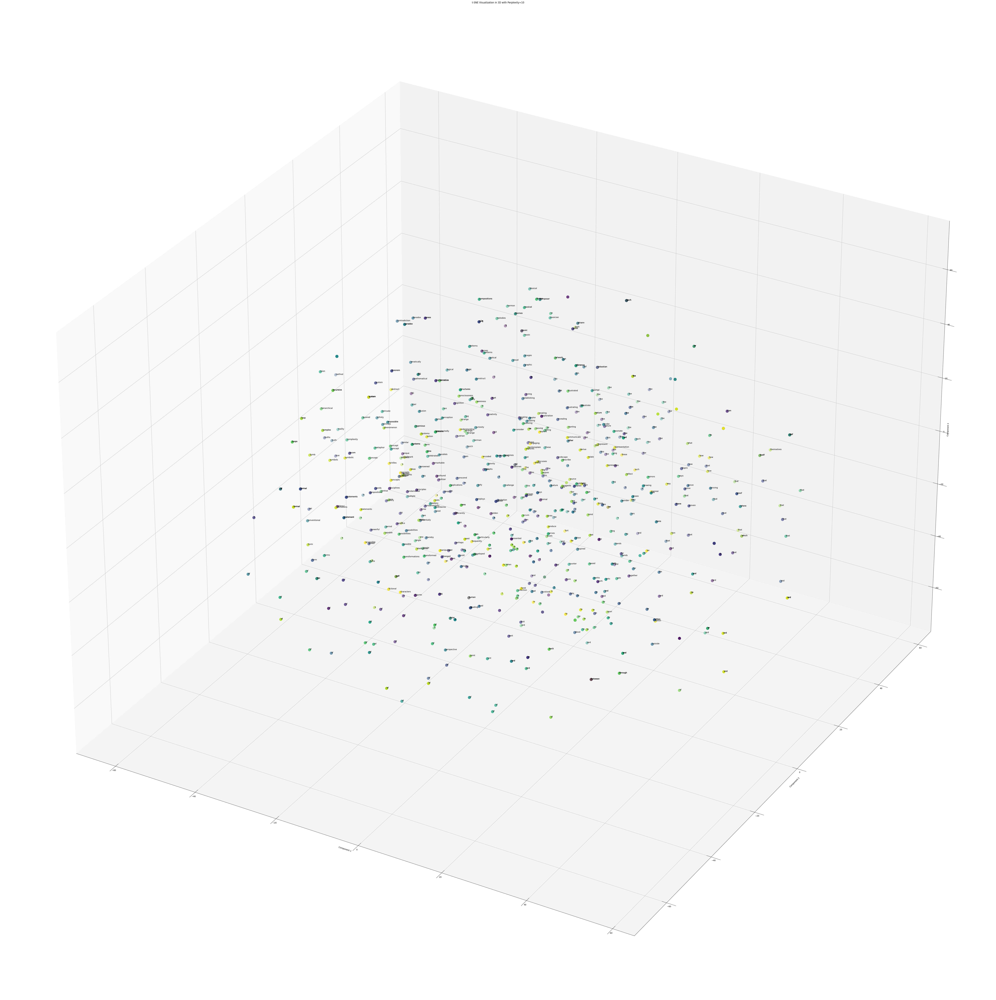

In [8]:
apply_TSNE(df, vectors)

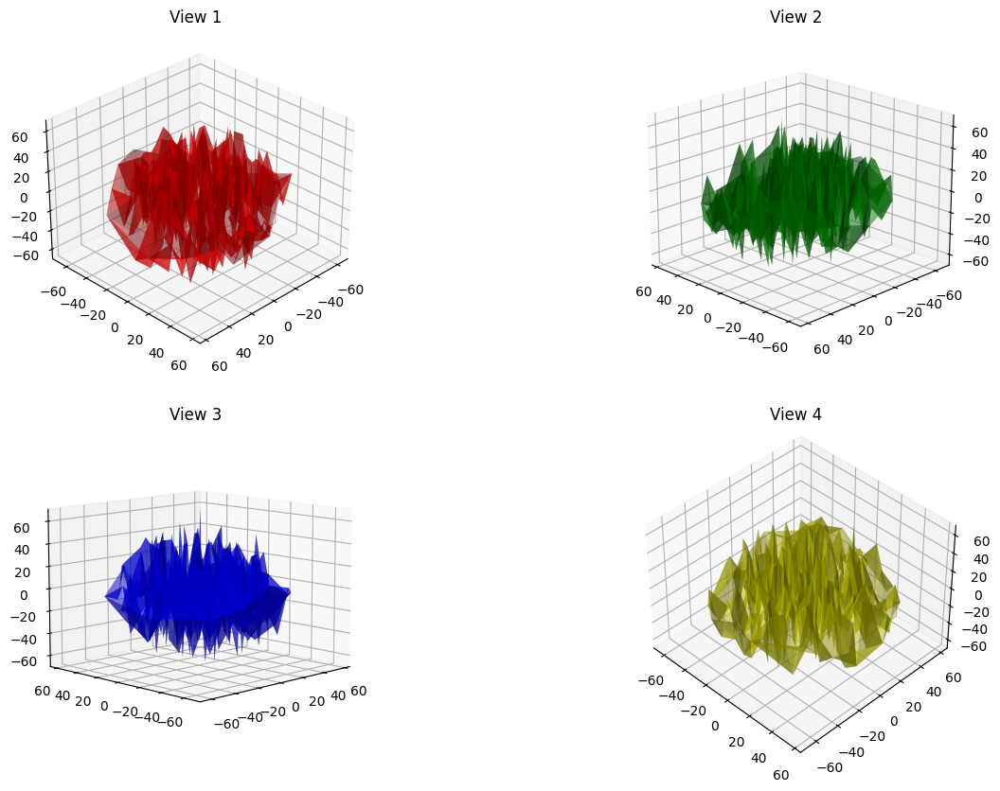

In [9]:
surface_reconstruction(df, vectors, surface_alpha = 0.5)

# Dimensional analysis

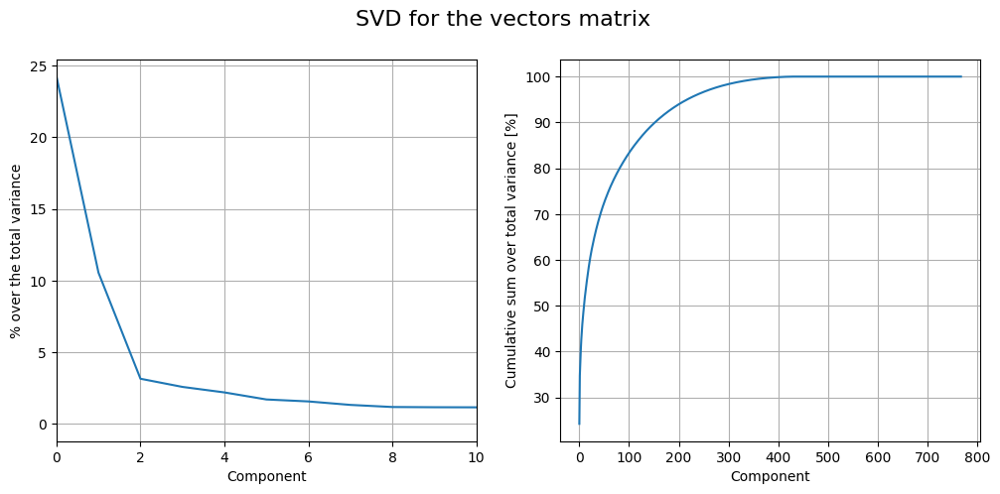

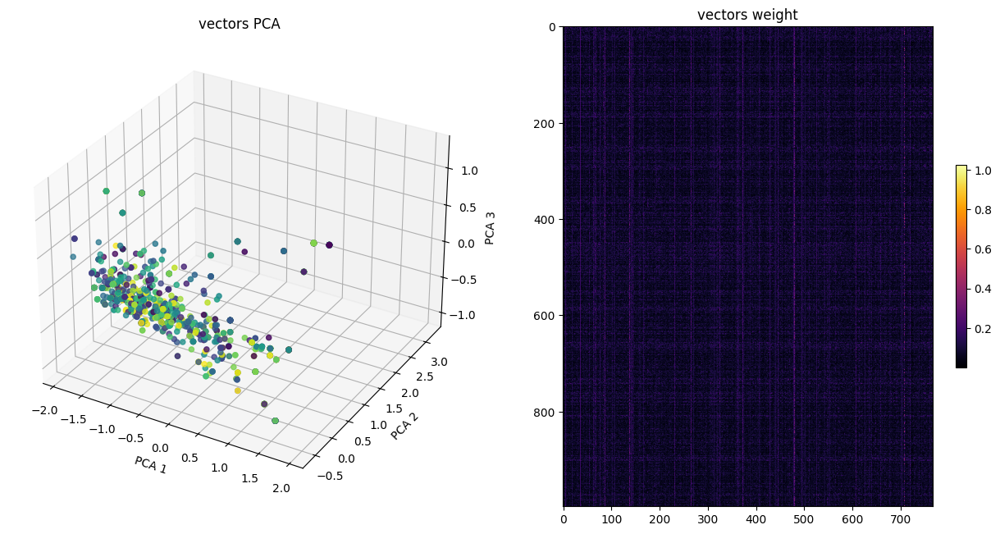

In [10]:
svd_and_pca(vectors)

# Positional Encoding

In [11]:
# Accessing the positional embedding
positional_embeddings = model.transformer.wpe.weight  # Tensor of positions
print("Shape of positional embeddings matrix:", positional_embeddings.shape)

# Sum of positional embedding matrix and input vectors matrix
vectors_tensor = torch.from_numpy(vectors)  # Conversion of vectors to a torch object
results = vectors_tensor + positional_embeddings[:tokens.shape[0], :]  # Sum
results = results.detach().numpy()  # Conversion of the result in a numpy object

Shape of positional embeddings matrix: torch.Size([1024, 768])


### TSNE Analysis

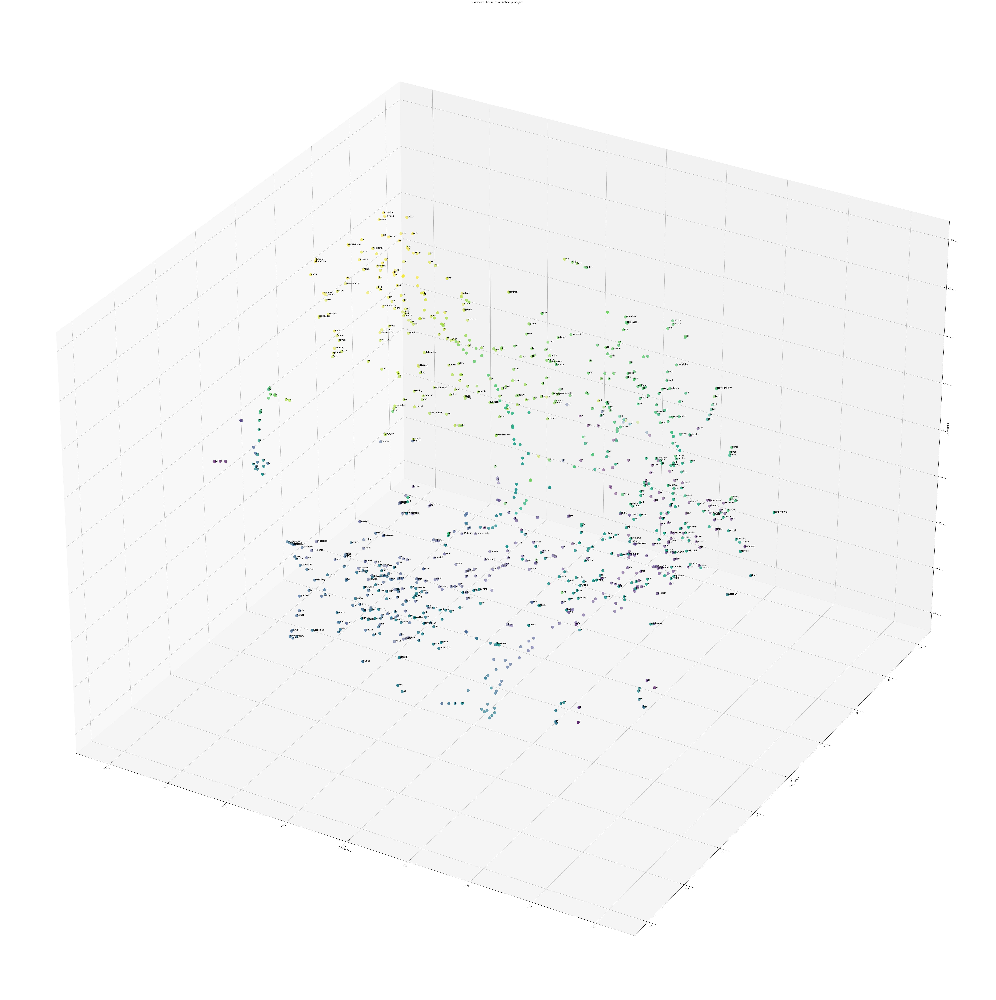

In [12]:
apply_TSNE(df, results)

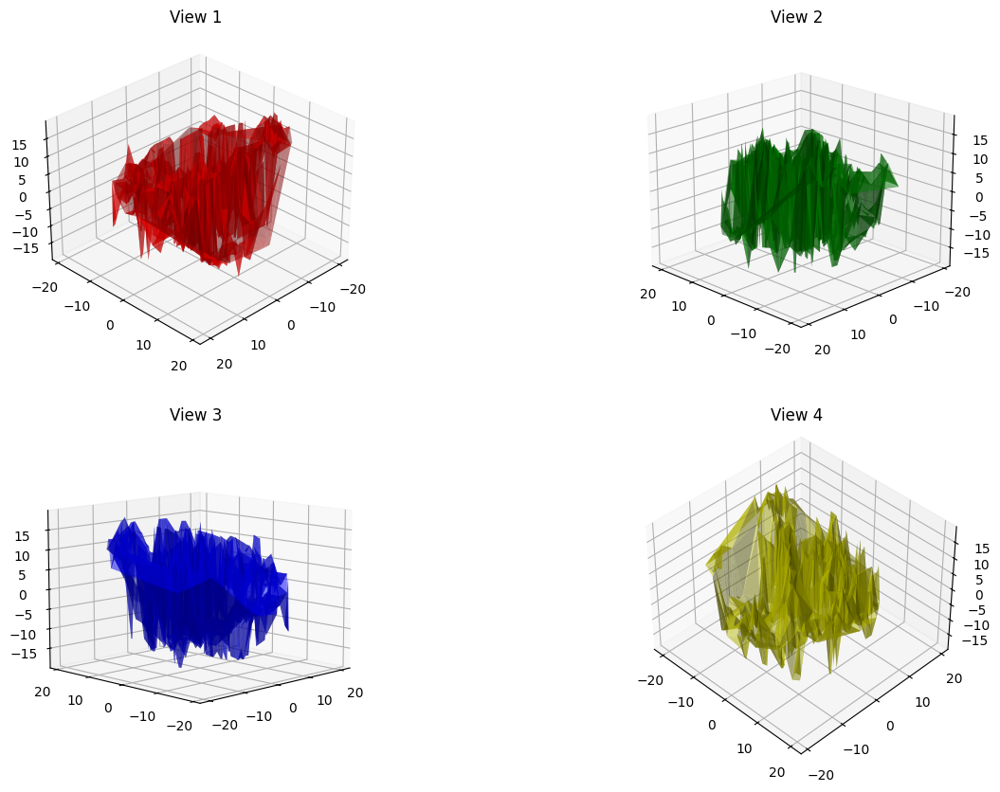

In [13]:
surface_reconstruction(df, results, surface_alpha = 0.5)

### Dimensional Analysis

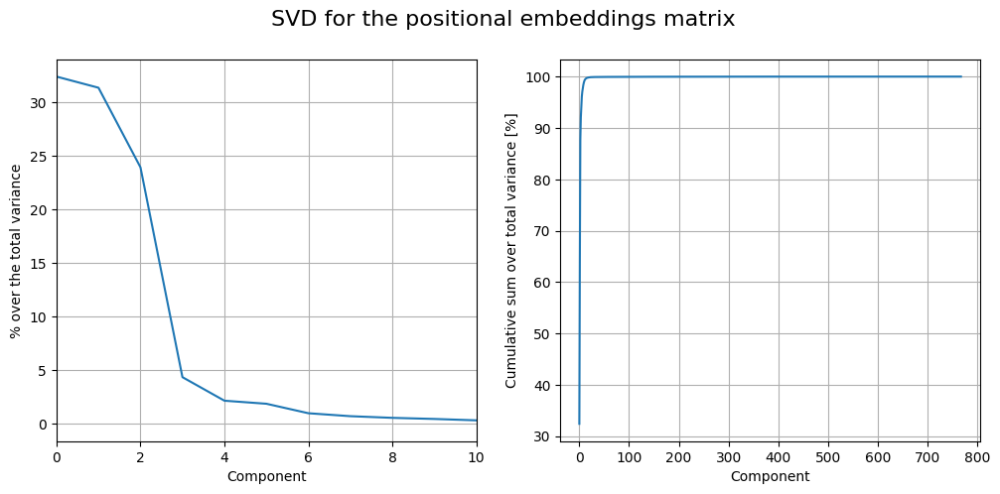

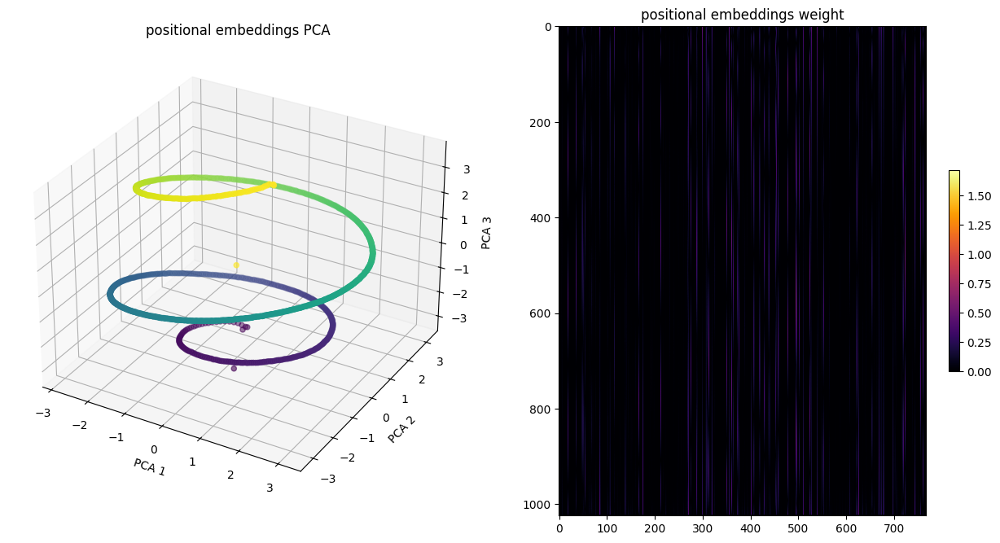

In [14]:
svd_and_pca(positional_embeddings, 'positional embeddings')

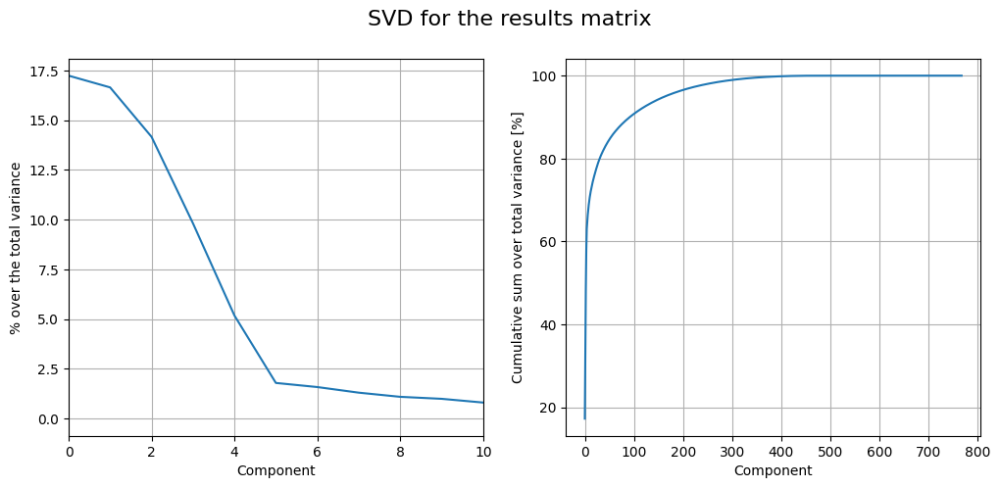

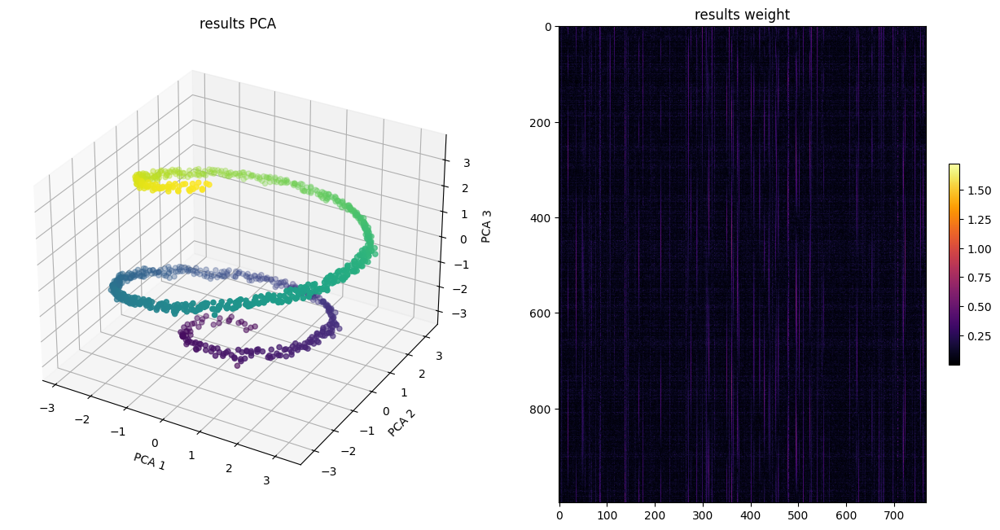

In [15]:
svd_and_pca(results, 'results')

### RoPE technique

In [16]:
#Brute force implementation of RoPE
def RoPE(x, pos, period = 1_024, d = 768):
    y = np.copy(x)
    for i in range(1, d//2+1):
        theta_i = pos * period**(-2*(i-1)/d)
        rotation = np.array([[np.cos(theta_i), -np.sin(theta_i)],  
                             [np.sin(theta_i), np.cos(theta_i)]])
        y[2*i-2:2*i] = np.dot(rotation, y[2*i-2:2*i])
    return y

Rotation of the dataset with RoPE:

In [17]:
rotated_vectors = np.array([RoPE(x, i+1) for i,x in enumerate(vectors)])
df['rotated_vectors'] = rotated_vectors.tolist()

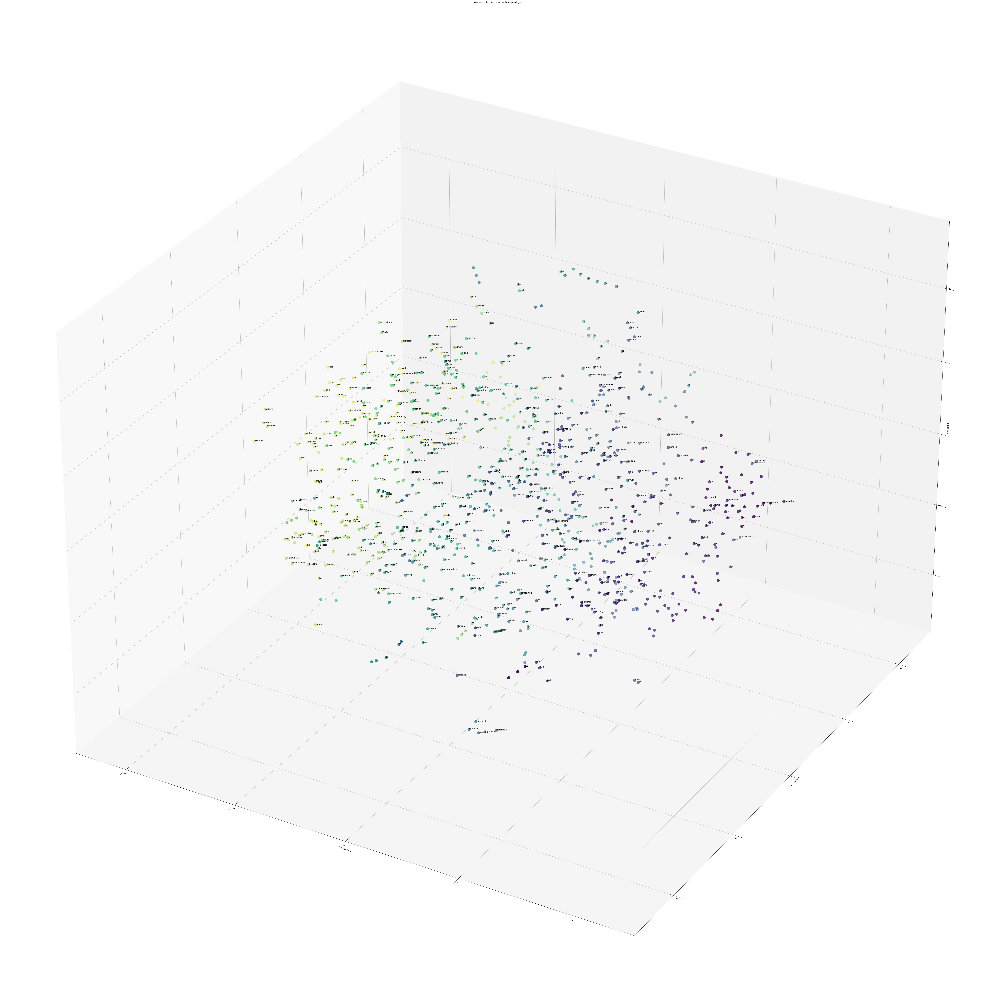

In [18]:
apply_TSNE(df, rotated_vectors)

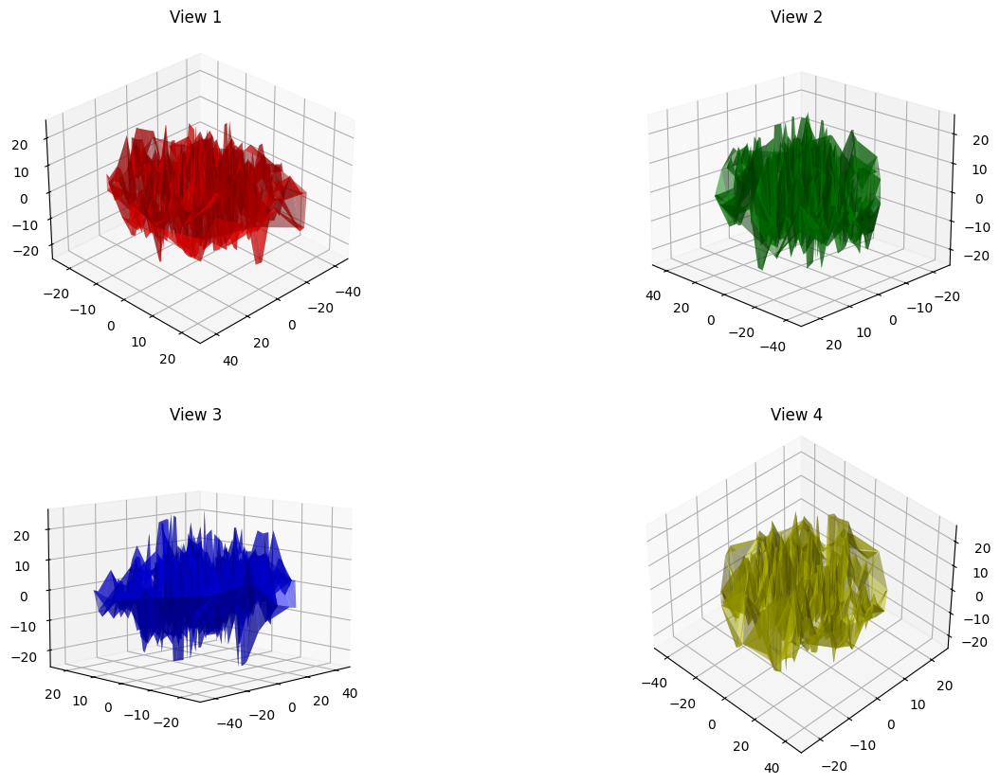

In [19]:
surface_reconstruction(df, rotated_vectors, surface_alpha = 0.5)

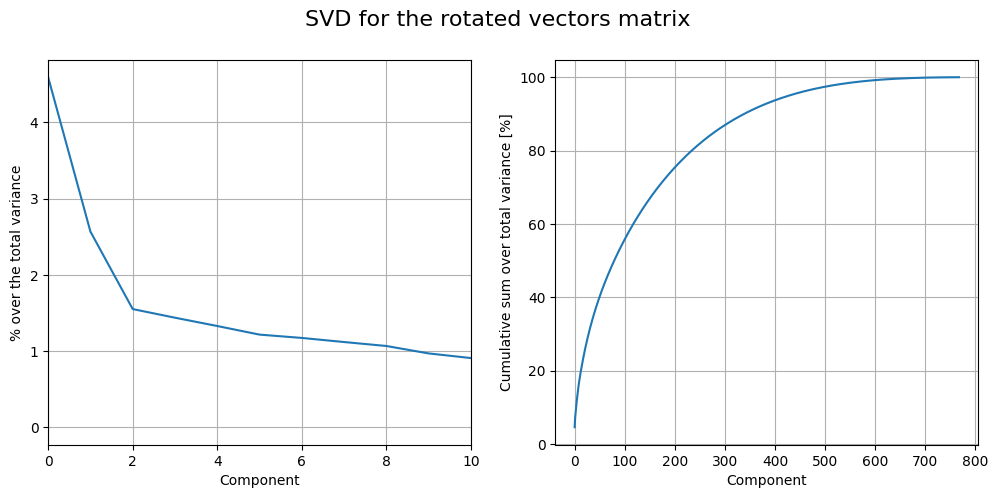

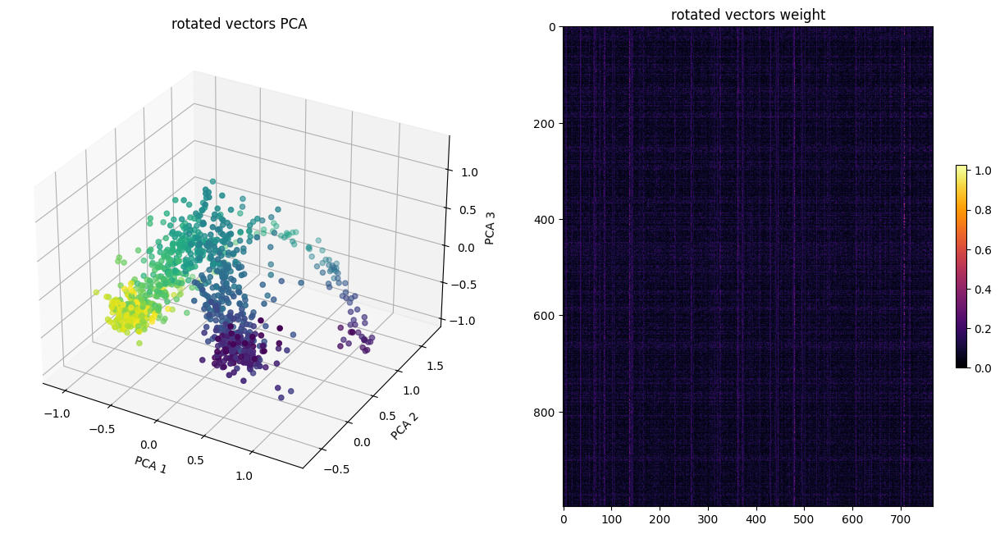

In [20]:
svd_and_pca(rotated_vectors, 'rotated vectors')

### Metric Comparisons

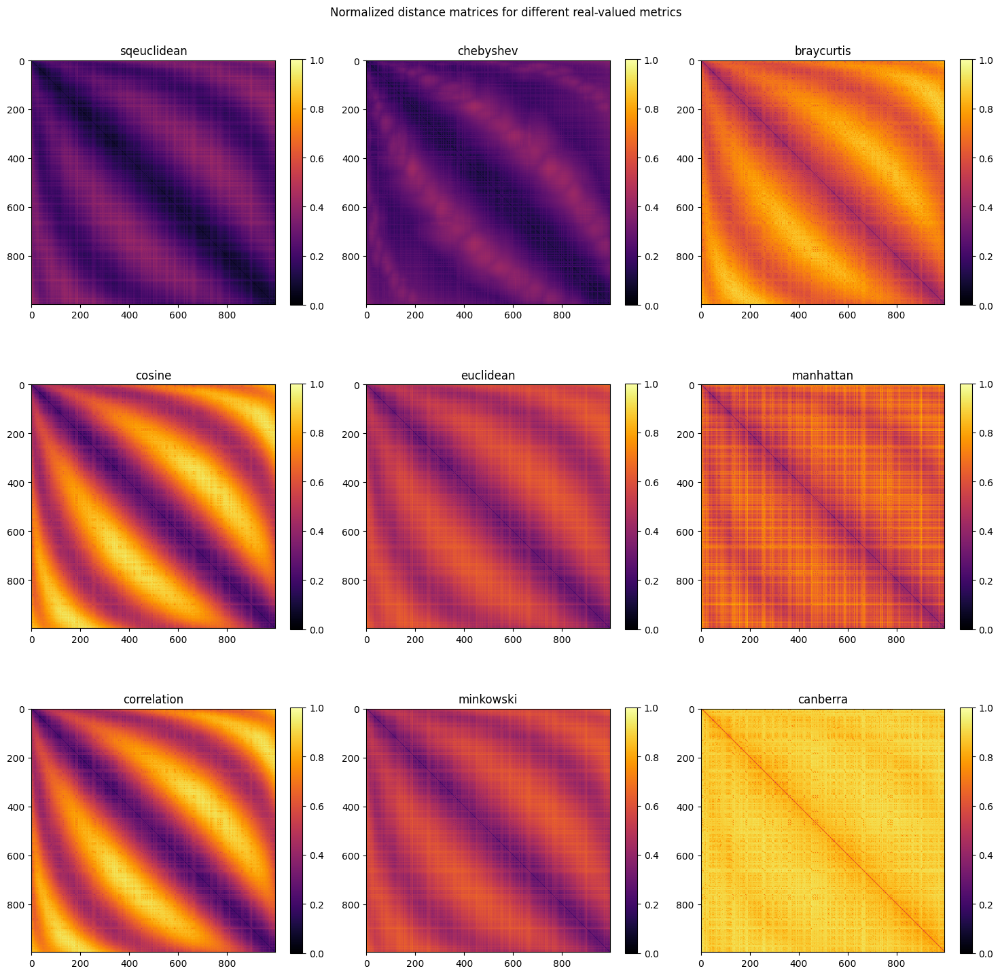

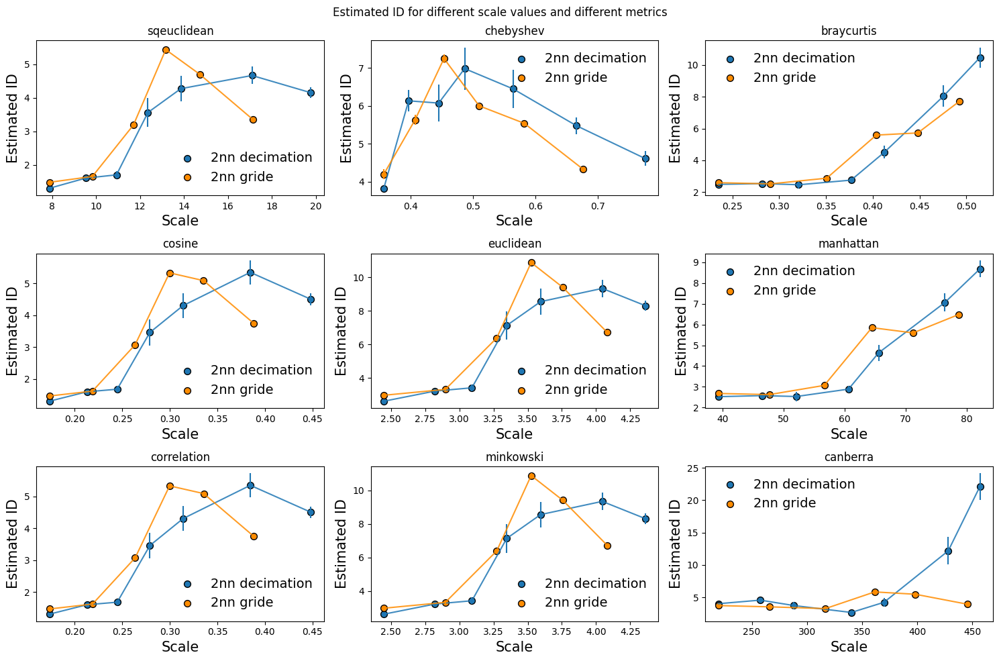

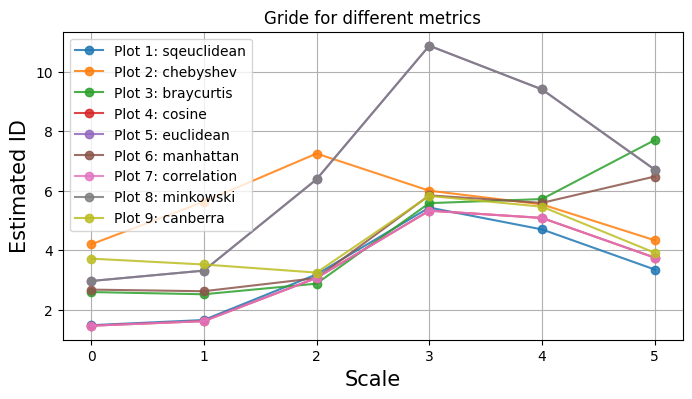

In [21]:
metric_comparisons(results)